# Analysis and Modeling of US Census 

This notebooks contains my approach to building an estimator to predict whether or not an individual in our dataset is earning more then 50.000 $ per year.

After doing an exploratory data analysis to understand the different variables in the dataset, I finetuned and compared a penalized Logistic Regression Classifier and a Random Forest Classifier, comparing also different preprocessing-pipelines for the data. 

The model I favor is a Logistic Regression Classifier that uses only 8 input variables, and performs with accuracy 94.24% when applied to the test data set. 

I ran this notebook in Google Collab where all plots are interactively available. I included screenshots, if this notebook will be opened with jupyter. 

## Table of contents
### 1. [Loading the Data](#load)
### 2. [Explatory Data Analysis](#eda)
### 3. [Cleaning and Preprocessing](#clean)
### 4. [Prediction](#predict)
### 5. [Model Selection](#select)
### 6. [Evaluate on Test Set](#evaluate)
### 7. [Outlook & Coments](#outlook)

## Information about the data

This US Census dataset contains detailed but anonymized information for approximately 300,000 people.
(download: http://thomasdata.s3.amazonaws.com/ds/us_census_full.zip)

The archive contains 3 files:   

1) A large training file (csv)

2) Another test file (csv)

3) A metadata file (txt) describing the columns of the two csv files (identical for both)

The structure of the files should be as follows to execute the notebook: 
```
.
├── Census_Analysis.ipynb
├── eda_report.html
├── us-census-full
   ├── census_income_learn.csv
   └──census_income_test.csv

```



#### Define root_path and install libraries 

In [6]:
#run if run on google collab
from google.colab import drive
drive.mount('/content/drive',force_remount=True)
root_path = 'drive/My Drive/Colab Notebooks/Census_Analysis/'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
# if in local
root_path = ""

In [0]:
#import libraries 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import pandas as pd
import warnings

#sklearn imports
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing

from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score

# %pip install pandas-profiling[notebook,html]
# %pip install phik
# from pandas_profiling import ProfileReport
# import phik

warnings.filterwarnings('ignore')

# 1. Load the Data  <a name="load"></a>

In [0]:
#parse column names from .txt file 
colnames = ["age","class of worker","detailed_industry_recode","detailed occupation recode","education","wage_per_hour","enroll_in _edu_inst_last_wk","marital_stat","major_industry_code","major_occupation_code","race","hispanic_origin","sex","member_of_a_labor_union","reason_for_unemployment","full or part time employment stat","capital gains","capital losses","dividends from stocks","federal income tax liability","tax filer stat","region of previous residence","state of previous residence","detailed household and family stat","detailed household summary in household","migration code-change in msa","migration code-change in reg","migration code-move within reg","live in this house 1 year ago","migration prev res in sunbelt","num persons worked for employer","family members under 18","country of birth father","country of birth mother","country of birth self","citizenship","own business or self employed","fill inc questionnaire for veteran's admin","veterans benefits","weeks worked in year","year","income"] 
#replace spaces
colnames = [name.replace(" ", "_") for name in colnames]

In [0]:
#reading in the test and train file 
us_census_train = pd.read_csv(root_path+"us_census_full/census_income_learn.csv",header=None,names=colnames)
us_census_test = pd.read_csv(root_path+"us_census_full/census_income_test.csv",header=None,names=colnames)

In [10]:
#double check we have data set in the format as described in the metadata
print(us_census_train.shape)
print(us_census_test.shape)
print("Total number of records",len(us_census_train)+len(us_census_test))

(199523, 42)
(99762, 42)
Total number of records 299285


In [0]:
pd.set_option('display.max_columns', None)
us_census_train.head(2)

,age,class_of_worker,detailed_industry_recode,detailed_occupation_recode,education,wage_per_hour,enroll_in__edu_inst_last_wk,marital_stat,major_industry_code,major_occupation_code,race,hispanic_origin,sex,member_of_a_labor_union,reason_for_unemployment,full_or_part_time_employment_stat,capital_gains,capital_losses,dividends_from_stocks,federal_income_tax_liability,tax_filer_stat,region_of_previous_residence,state_of_previous_residence,detailed_household_and_family_stat,detailed_household_summary_in_household,migration_code-change_in_msa,migration_code-change_in_reg,migration_code-move_within_reg,live_in_this_house_1_year_ago,migration_prev_res_in_sunbelt,num_persons_worked_for_employer,family_members_under_18,country_of_birth_father,country_of_birth_mother,country_of_birth_self,citizenship,own_business_or_self_employed,fill_inc_questionnaire_for_veteran's_admin,veterans_benefits,weeks_worked_in_year,year,income
0,73,Not in universe,0,0,High school graduate,0,Not in universe,Widowed,Not in universe or children,Not in universe,White,All other,Female,Not in universe,Not in universe,Not in labor force,0,0,0,Nonfiler,Not in universe,Not in universe,Other Rel 18+ ever marr not in subfamily,Other relative of householder,1700.09,?,?,?,Not in universe under 1 year old,?,0,Not in universe,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,0,95,- 50000.
1,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,White,All other,Male,Not in universe,Not in universe,Children or Armed Forces,0,0,0,Head of household,South,Arkansas,Householder,Householder,1053.55,MSA to MSA,Same county,Same county,No,Yes,1,Not in universe,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.


In [0]:
us_census_test.head(2)

,age,class_of_worker,detailed_industry_recode,detailed_occupation_recode,education,wage_per_hour,enroll_in__edu_inst_last_wk,marital_stat,major_industry_code,major_occupation_code,race,hispanic_origin,sex,member_of_a_labor_union,reason_for_unemployment,full_or_part_time_employment_stat,capital_gains,capital_losses,dividends_from_stocks,federal_income_tax_liability,tax_filer_stat,region_of_previous_residence,state_of_previous_residence,detailed_household_and_family_stat,detailed_household_summary_in_household,migration_code-change_in_msa,migration_code-change_in_reg,migration_code-move_within_reg,live_in_this_house_1_year_ago,migration_prev_res_in_sunbelt,num_persons_worked_for_employer,family_members_under_18,country_of_birth_father,country_of_birth_mother,country_of_birth_self,citizenship,own_business_or_self_employed,fill_inc_questionnaire_for_veteran's_admin,veterans_benefits,weeks_worked_in_year,year,income
0,38,Private,6,36,1st 2nd 3rd or 4th grade,0,Not in universe,Married-civilian spouse present,Manufacturing-durable goods,Machine operators assmblrs & inspctrs,White,Mexican (Mexicano),Female,Not in universe,Not in universe,Full-time schedules,0,0,0,Joint one under 65 & one 65+,Not in universe,Not in universe,Spouse of householder,Spouse of householder,1032.38,?,?,?,Not in universe under 1 year old,?,4,Not in universe,Mexico,Mexico,Mexico,Foreign born- Not a citizen of U S,0,Not in universe,2,12,95,- 50000.
1,44,Self-employed-not incorporated,37,12,Associates degree-occup /vocational,0,Not in universe,Married-civilian spouse present,Business and repair services,Professional specialty,White,All other,Female,Not in universe,Not in universe,PT for econ reasons usually PT,0,0,2500,Joint both under 65,Not in universe,Not in universe,Spouse of householder,Spouse of householder,1462.33,?,?,?,Not in universe under 1 year old,?,1,Not in universe,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,26,95,- 50000.


In [11]:
# recode variables as categorical where needed (for plots, labelencoding later)
print("types before conversion\n", us_census_train.dtypes)

transform_to_categorical = ["detailed_industry_recode","detailed_occupation_recode","own_business_or_self_employed","veterans_benefits"]
us_census_train[transform_to_categorical] = us_census_train[transform_to_categorical].astype('category')
us_census_test[transform_to_categorical] = us_census_test[transform_to_categorical].astype('category')
print("\n types afer conversion \n", us_census_train.dtypes)

types before conversion
 age                                             int64
class_of_worker                                object
detailed_industry_recode                        int64
detailed_occupation_recode                      int64
education                                      object
wage_per_hour                                   int64
enroll_in__edu_inst_last_wk                    object
marital_stat                                   object
major_industry_code                            object
major_occupation_code                          object
race                                           object
hispanic_origin                                object
sex                                            object
member_of_a_labor_union                        object
reason_for_unemployment                        object
full_or_part_time_employment_stat              object
capital_gains                                   int64
capital_losses                                  int64
div

In [0]:
# map income to 0 - 1
map_income = {
    ' - 50000.': 0,
    ' 50000+.': 1}

us_census_train["income"] = [map_income[value] for value in us_census_train.income]
us_census_train["income"] = us_census_train["income"].astype('category')

us_census_test["income"] = [map_income[value] for value in us_census_test.income]
us_census_test["income"] = us_census_test["income"].astype('category')

# REPLACE "?" with NAN
us_census_train = us_census_train.replace(' ?', np.nan)
us_census_test = us_census_test.replace(' ?', np.nan)

In [0]:
us_census_train.head(2)

,age,class_of_worker,detailed_industry_recode,detailed_occupation_recode,education,wage_per_hour,enroll_in__edu_inst_last_wk,marital_stat,major_industry_code,major_occupation_code,race,hispanic_origin,sex,member_of_a_labor_union,reason_for_unemployment,full_or_part_time_employment_stat,capital_gains,capital_losses,dividends_from_stocks,federal_income_tax_liability,tax_filer_stat,region_of_previous_residence,state_of_previous_residence,detailed_household_and_family_stat,detailed_household_summary_in_household,migration_code-change_in_msa,migration_code-change_in_reg,migration_code-move_within_reg,live_in_this_house_1_year_ago,migration_prev_res_in_sunbelt,num_persons_worked_for_employer,family_members_under_18,country_of_birth_father,country_of_birth_mother,country_of_birth_self,citizenship,own_business_or_self_employed,fill_inc_questionnaire_for_veteran's_admin,veterans_benefits,weeks_worked_in_year,year,income
0,73,Not in universe,0,0,High school graduate,0,Not in universe,Widowed,Not in universe or children,Not in universe,White,All other,Female,Not in universe,Not in universe,Not in labor force,0,0,0,Nonfiler,Not in universe,Not in universe,Other Rel 18+ ever marr not in subfamily,Other relative of householder,1700.09,NaN,NaN,NaN,Not in universe under 1 year old,NaN,0,Not in universe,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,0,95,0
1,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,White,All other,Male,Not in universe,Not in universe,Children or Armed Forces,0,0,0,Head of household,South,Arkansas,Householder,Householder,1053.55,MSA to MSA,Same county,Same county,No,Yes,1,Not in universe,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,0


# 2. EDA  <a name="eda"></a>
*Perform an exploratory analysis on the data and create some relevant visualisations.*

I am doing an EDA in order to better understand the data and especially to get a first feeling of those variables in the data set, that might have the most predictive power in regards to the target variable. 

I am not analysing the test data set, so that it really is independent from my work of creating the model. 



## Summary Statistics

In [0]:
# Look at distributions of the different variables 
us_census_train.describe()

,age,wage_per_hour,capital_gains,capital_losses,dividends_from_stocks,detailed_household_summary_in_household,num_persons_worked_for_employer,weeks_worked_in_year,year
count,199523.000000,199523.000000,199523.00000,199523.000000,199523.000000,199523.000000,199523.000000,199523.000000,199523.000000
mean,34.494199,55.426908,434.71899,37.313788,197.529533,1740.380269,1.956180,23.174897,94.499672
std,22.310895,274.896454,4697.53128,271.896428,1984.163658,993.768156,2.365126,24.411488,0.500001
min,0.000000,0.000000,0.00000,0.000000,0.000000,37.870000,0.000000,0.000000,94.000000
25%,15.000000,0.000000,0.00000,0.000000,0.000000,1061.615000,0.000000,0.000000,94.000000
50%,33.000000,0.000000,0.00000,0.000000,0.000000,1618.310000,1.000000,8.000000,94.000000
75%,50.000000,0.000000,0.00000,0.000000,0.000000,2188.610000,4.000000,52.000000,95.000000
max,90.000000,9999.000000,99999.00000,4608.000000,99999.000000,18656.300000,6.000000,52.000000,95.000000


##  ProfileReport
(Open file eda_report.html in Browser to see plots)

In [0]:
#profile = ProfileReport(us_census_train, title='Pandas Profiling Report', html={'style':{'full_width':True}})
#profile.to_file(output_file="eda_report.html")

#### Comments on pandas-profiling report:  
* variables with highest cardinality: 
  * detailed_industry_recode has a high cardinality: 52 distinct values	
  * 
region_of_previous_residence has a high cardinality: 51 distinct values. 

* correlated variables: We have correlations between a number of variables. We should investigate and remove/merge variables in feature engineering. This is expected for variables that represent the same information in different granularity such as major_industry_code and  detailed_industry_recode: 

  * major_industry_code is highly correlated with detailed_industry_recode

  * major_occupation_code is highly correlated with detailed_occupation_recode
  * region_of_previous_residence is highly correlated with tax_filer_stat

*  We have a few variables that contain missing values, I need to take this into account for feature engineering.

* sparse variables: 
  * wage_per_hour has  (94.3%) zeros	
  * capital_gains has (96.3%) zeros
  * capital_losses (98.0%) zeros
  * dividends_from_stocks has 89.4% zeros



##  Phi-K Correlation between Variables

In [0]:
# Heatmap
phik_matrix = us_census_train.phik_matrix()


### Correlation Heatmap
The pandas profiling provides us with correlation matrixes for all continous variables.


The majority of our variables (including the target) are categorical variables, so I am looking for a way to visualise relationships between these. I used the phi-k coefficient developed at the University of Amsterdam and presented in "A new correlation coefficient between categorical, ordinal and interval variables with Pearson characteristics" last year. (https://arxiv.org/pdf/1811.11440.pdf)

I am especially interested in correlations between variables in order to filter out potentially interesting features in relationship to the target variable (income). 


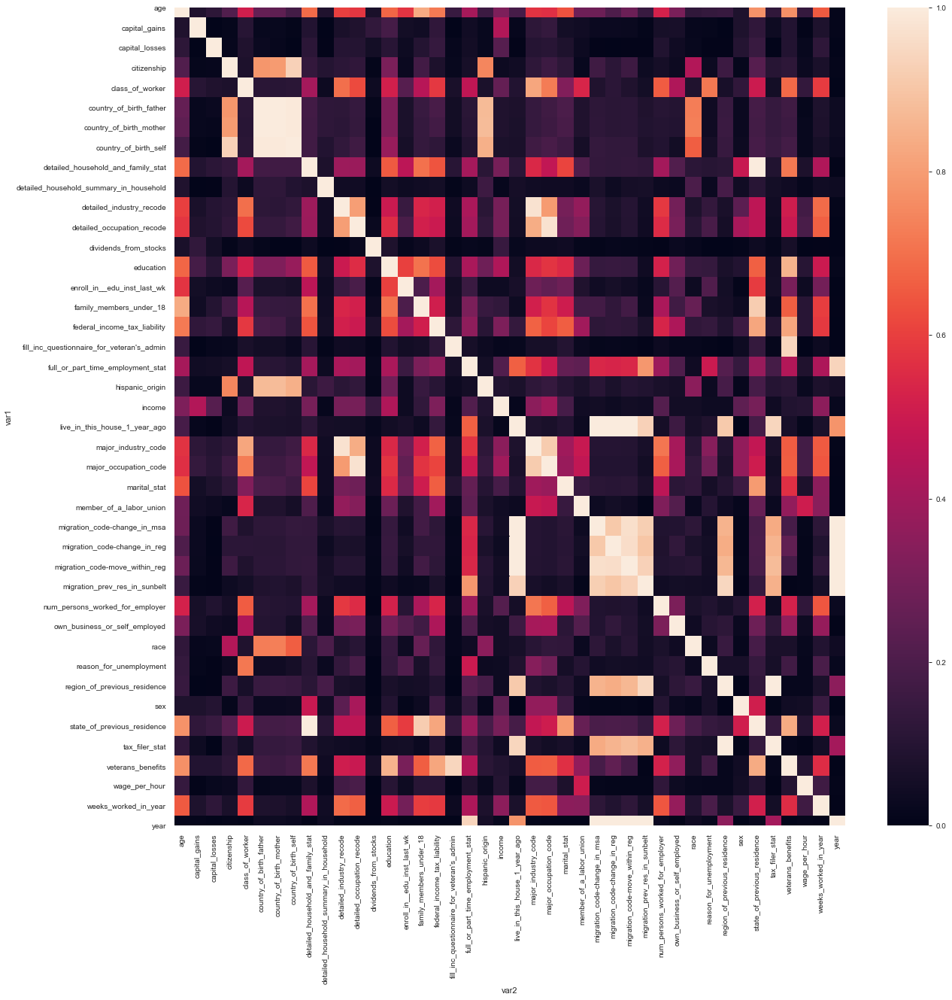

In [0]:
plt.figure(figsize=(20,20))
ax = sns.heatmap(phik_matrix)

In [0]:
#looking at the variables with the strongest phi - k correlation to target variable "income"
print(phik_matrix['income'].sort_values(ascending=False).head(10))

var1
income                                1.000000
capital_gains                         0.441123
education                             0.433194
major_occupation_code                 0.400942
weeks_worked_in_year                  0.352279
major_industry_code                   0.350089
federal_income_tax_liability          0.318484
age                                   0.316778
detailed_occupation_recode            0.303718
detailed_household_and_family_stat    0.302546
Name: income, dtype: float64


### Selected Plots

#### Income and Age

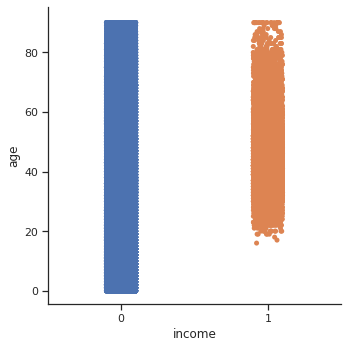

In [0]:
%matplotlib inline
sns.set(style="ticks")
sns.catplot(x="income", y="age", data=us_census_train)


#### Education, Age and Income

In [0]:
fig = px.scatter(us_census_train, x="age", y="education", color="income",
                 title="Education / Age, colored by income class",
                 labels={"age":"Age"})
fig.show()

**Comment**
The plot confirms a few intuitions: We see more people in the income class 50.000+ where eduaction is higher: Especially individuals holding a professor, master or doctorate degree have a higher probability of belonging to the higher income class. A low level of education is associated with a low probability of belonging to the high income class.

Not suprisingly we also see that education class children is the same variable as age < 18.

In fact we see that:

In [0]:
all_phds = us_census_train[us_census_train.education == ' Doctorate degree(PhD EdD)']
rich_phds = all_phds[all_phds.income == 1]
print("Doctorate degree holders with an income > 50.000 is ",len(rich_phds)/len(all_phds)*100,"%")

all_master_prof_doctor = us_census_train[(us_census_train.education == ' Doctorate degree(PhD EdD)') | (us_census_train.education == "Masters degree(MA MS MEng MEd MSW MBA)")|(us_census_train.education == " Prof school degree (MD DDS DVM LLB JD)" ) ]
rich_master_prof_doctor = all_master_prof_doctor[all_master_prof_doctor.income == 1]
print("Doctorate degree holders, Professor, Masters with an income > 50.000 is ",len(rich_master_prof_doctor)/len(all_master_prof_doctor)*100,"%")

Doctorate degree holders with an income > 50.000 is  52.01900237529691 %
Doctorate degree holders, Professor, Masters with an income > 50.000 is  53.20680628272252 %


#### Capital Gains, Age and Income

In [0]:
fig = px.scatter(us_census_train, x="age", y="capital_gains", color="income",
                 title="Capital gains / Age, colored by income class",
                 labels={"age":"Age"}
                )
fig.show()

#### Occupation, Age and Income

In [0]:
fig = px.scatter(us_census_train, x="age", y="detailed_occupation_recode", color="income",
                 title="detailed_occupation_recode / age, colored by income class",
                 labels={"age":"Age"}
                )
fig.show()

#### Wage per Hour, Occupation, Income

In [0]:
fig = px.box(us_census_train, x="major_occupation_code",y="wage_per_hour", color="income",
                 title="major_occupation_code / wage per hour by income",
                 labels={"age":"Age"}
                )
fig.show()

Output hidden; open in https://colab.research.google.com to view.

**Comments**
The plot shows that mean wage per hour and the spread of wages differs between occupations. 
In the data set we have furthermore no indvidual that is working in private household services and belongs to the higher income class.   
Interestingly, we see high hourly wages at the extreme end of the distribution for individuals not belonging to the high income class. This might be not suprising however, as we have  Probability for the label '- 50000' of 93.80%, thus much more observations in this category (and hence should expect to see more extreme values by chance). 

#### Industry Recode, Wage, Income

In [0]:
fig = px.scatter(us_census_train, x="detailed_industry_recode",y="wage_per_hour", color="income",
                 title="detailed_industry_recode / age by income",
                 labels={"age":"Age"}
                )
fig.show()


# 3. Clean, preprocess, and engineer features in the training data  <a name="clean"></a>

## Cleaning
### Dropping Duplicates

In [13]:
#DROP DUPLICATES
us_census_train_without_duplicates = us_census_train.drop_duplicates()
print("Dropped",(len(us_census_train) - len(us_census_train_without_duplicates)),"duplicates in training data ")

us_census_test_without_duplicates = us_census_test.drop_duplicates()
print("Dropped",(len(us_census_test) - len(us_census_test_without_duplicates)),"duplicates in testing data ")

#use from now on only data without duplicates
us_census_train = us_census_train_without_duplicates
us_census_test = us_census_test_without_duplicates

Dropped 3229 duplicates in training data 
Dropped 883 duplicates in testing data 


### Missing Values and Variable Encoding
We have missing values for many variables, encoded differently - sometimes with "0", sometimes with "not in universe" (NIU) description. I don't know if values are missing at random, especially the "NIU" ones could be missing not at random / simply mean "none of the other apply".

*Assumption*: "?" are missing values, not in universe means none of the other categories apply.


The best way to handle missing values depends on the choice of algorithm. I will therefore create different preprocessed inputs.


**A) (Penalized) Logistic Regression**

As a baseline I evaluate the performance of a logistic regression. For this I will impute missing data with the mode. 


*Dataset X_a*: All features, mode imputation on missing values. 

*Dataset X_b*: Hand selected limited number of features, mode imputation on missing values. 

*Dataset X_b_2*: Only 8 variables selected by hand, mode imputation on missing values. 

**B) Random Forest Classifier**

*Dataset* X_c: All features, missing values untreated.  

Since we have a mix of categorical and numerical input features, using an ensemble of weak predictors could be successful. I want to evaluate a random forest. I want to try this method *without* imputing missing data before, as a random forests can handle missing values through repeated subsampling of features and datasets "by themselves".  

### Impute Missing Values

In [0]:
# ## Creation of data set X_a: mode-imputation of missing values, all features
us_census_train_imputed = us_census_train
us_census_test_imputed = us_census_test

for col in ['region_of_previous_residence', 'migration_code-change_in_msa', 'migration_code-change_in_reg',"migration_code-move_within_reg","migration_prev_res_in_sunbelt","country_of_birth_father","country_of_birth_mother","country_of_birth_self"]:
    us_census_train_imputed[col].fillna(us_census_train_imputed[col].mode()[0], inplace=True)
    us_census_test_imputed[col].fillna(us_census_test_imputed[col].mode()[0], inplace=True)


In [0]:
#print("Missing Values in us_census_train",us_census_train.isnull().sum())
#print("Missing Values in us_census_test",us_census_test.isnull().sum())
#print("##############################'")
#print("Missing Values in us_census_train_imputed",us_census_train_imputed.isnull().sum())
#print("Missing Values in us_census_test_imputed",us_census_test_imputed.isnull().sum())

## X_a


In [22]:
X_a = us_census_train_imputed.drop(['income'], axis=1)
y_a = us_census_train_imputed['income']

##Split data into separate training and test set
X_a_train, X_a_test, y_a_train, y_a_test = train_test_split(X_a, y_a, test_size = 0.3, random_state = 1)

numeric = X_a._get_numeric_data().columns
categorical = X_a.select_dtypes(include=['object','category']).columns

#####Encode categorical variables
for feature in categorical:
      le = preprocessing.LabelEncoder()
      X_a_train[feature] = le.fit_transform(X_a_train[feature])
      X_a_test[feature] = le.transform(X_a_test[feature])

#Standardize features by removing the mean and scaling to unit variance
scaler = StandardScaler()
X_a_train = pd.DataFrame(scaler.fit_transform(X_a_train), columns = X_a.columns)

X_a_test = pd.DataFrame(scaler.transform(X_a_test), columns = X_a.columns)
X_a_train.head()

,age,class_of_worker,detailed_industry_recode,detailed_occupation_recode,education,wage_per_hour,enroll_in__edu_inst_last_wk,marital_stat,major_industry_code,major_occupation_code,race,hispanic_origin,sex,member_of_a_labor_union,reason_for_unemployment,full_or_part_time_employment_stat,capital_gains,capital_losses,dividends_from_stocks,federal_income_tax_liability,tax_filer_stat,region_of_previous_residence,state_of_previous_residence,detailed_household_and_family_stat,detailed_household_summary_in_household,migration_code-change_in_msa,migration_code-change_in_reg,migration_code-move_within_reg,live_in_this_house_1_year_ago,migration_prev_res_in_sunbelt,num_persons_worked_for_employer,family_members_under_18,country_of_birth_father,country_of_birth_mother,country_of_birth_self,citizenship,own_business_or_self_employed,fill_inc_questionnaire_for_veteran's_admin,veterans_benefits,weeks_worked_in_year,year
0,-0.896401,-0.444150,-0.861091,-0.792938,-0.974392,-0.203223,0.245897,0.714115,0.211552,-0.099358,0.414681,-0.364755,1.045006,0.219322,-0.030242,1.083847,-0.093883,-0.137311,-0.101246,0.570340,-0.018141,0.176061,-1.072996,-0.964606,-0.666890,0.24768,-0.017523,0.012704,-0.541136,0.077401,-0.837265,-1.964530,0.384597,0.380284,0.279969,0.345835,-0.320327,0.061936,0.552589,-0.963078,1.001566
1,2.297147,-0.444150,-0.861091,-0.792938,0.953042,-0.203223,0.245897,0.714115,0.211552,-0.099358,0.414681,-0.364755,-0.956932,0.219322,-0.030242,-0.579936,-0.093883,-0.137311,-0.101246,1.287992,-0.018141,0.176061,0.153305,0.001431,0.046244,0.24768,-0.017523,0.012704,1.077242,0.077401,-0.837265,0.572328,0.384597,-3.364579,-4.140709,-1.445324,-0.320327,0.061936,0.552589,-0.963078,-0.998437
2,-0.086769,-2.242198,1.513294,-0.103087,-0.251604,-0.203223,0.245897,-0.701097,-1.657803,1.177509,0.414681,-0.364755,-0.956932,0.219322,-0.030242,-0.579936,-0.093883,-0.137311,-0.101246,-0.864963,-0.018141,0.176061,1.467199,1.450486,-1.441607,0.24768,-0.017523,0.012704,1.077242,0.077401,0.851330,0.572328,0.384597,0.380284,0.279969,0.345835,3.262608,0.061936,0.552589,1.166363,-0.998437
3,1.667433,-0.444150,-0.861091,-0.792938,0.471184,-0.203223,0.245897,-0.701097,0.211552,-0.099358,0.414681,-0.364755,-0.956932,0.219322,-0.030242,-0.579936,-0.093883,-0.137311,-0.101246,0.570340,-0.018141,0.176061,1.467199,1.450486,0.379252,0.24768,-0.017523,0.012704,1.077242,0.077401,-0.837265,0.572328,0.384597,0.380284,0.279969,0.345835,-0.320327,0.061936,0.552589,-0.963078,-0.998437
4,-0.806442,0.454874,0.961112,1.207629,-0.974392,-0.203223,-2.410350,0.714115,1.250082,0.219859,0.414681,-0.364755,-0.956932,0.219322,6.256276,5.243304,-0.093883,-0.137311,-0.101246,0.570340,-0.018141,0.176061,-1.072996,-0.964606,-0.775059,0.24768,-0.017523,0.012704,-0.541136,0.077401,-0.837265,-0.696101,0.384597,0.380284,0.279969,0.345835,-0.320327,0.061936,0.552589,-0.963078,1.001566


## X_b
Human feature selection removing some variables, mean imputed values

In [0]:
# drop detailed_industry_recode, only keep major_industry_code 
# drop detailed_occupation_recode, only keep major_occupation_code 
# drop the year - this should not carry relevant information 

# region_of_previous_residence is highly correlated with tax_filer_stat - to me it is hard to understand why. 
# after looking at the metadata, I decide to top  tax_filer_stat - this information should be largely contained in detailed household and family stat
drop_cols = ['income','detailed_industry_recode','detailed_occupation_recode','year',"tax_filer_stat"]
X_b = us_census_train_imputed.drop(drop_cols, axis=1)
y_b = us_census_train_imputed['income']


In [27]:
##Split data into separate training and test set
X_b_train, X_b_test, y_b_train, y_b_test = train_test_split(X_b, y_b, test_size = 0.3, random_state = 1)

numeric = X_b._get_numeric_data().columns
categorical = X_b.select_dtypes(include=['object','category']).columns

#####Encode categorical variables
#get all columns for numeric and non-numeric data

for feature in categorical:
      le = preprocessing.LabelEncoder()
      X_b_train[feature] = le.fit_transform(X_b_train[feature])
      X_b_test[feature] = le.transform(X_b_test[feature])

#Standardize features by removing the mean and scaling to unit variance

scaler = StandardScaler()
X_b_train = pd.DataFrame(scaler.fit_transform(X_b_train), columns = X_b.columns)

X_b_test = pd.DataFrame(scaler.transform(X_b_test), columns = X_b.columns)
X_b_train.head()

,age,class_of_worker,education,wage_per_hour,enroll_in__edu_inst_last_wk,marital_stat,major_industry_code,major_occupation_code,race,hispanic_origin,sex,member_of_a_labor_union,reason_for_unemployment,full_or_part_time_employment_stat,capital_gains,capital_losses,dividends_from_stocks,federal_income_tax_liability,region_of_previous_residence,state_of_previous_residence,detailed_household_and_family_stat,detailed_household_summary_in_household,migration_code-change_in_msa,migration_code-change_in_reg,migration_code-move_within_reg,live_in_this_house_1_year_ago,migration_prev_res_in_sunbelt,num_persons_worked_for_employer,family_members_under_18,country_of_birth_father,country_of_birth_mother,country_of_birth_self,citizenship,own_business_or_self_employed,fill_inc_questionnaire_for_veteran's_admin,veterans_benefits,weeks_worked_in_year
0,-0.896401,-0.444150,-0.974392,-0.203223,0.245897,0.714115,0.211552,-0.099358,0.414681,-0.364755,1.045006,0.219322,-0.030242,1.083847,-0.093883,-0.137311,-0.101246,0.570340,0.176061,-1.072996,-0.964606,-0.666890,0.24768,-0.017523,0.012704,-0.541136,0.077401,-0.837265,-1.964530,0.384597,0.380284,0.279969,0.345835,-0.320327,0.061936,0.552589,-0.963078
1,2.297147,-0.444150,0.953042,-0.203223,0.245897,0.714115,0.211552,-0.099358,0.414681,-0.364755,-0.956932,0.219322,-0.030242,-0.579936,-0.093883,-0.137311,-0.101246,1.287992,0.176061,0.153305,0.001431,0.046244,0.24768,-0.017523,0.012704,1.077242,0.077401,-0.837265,0.572328,0.384597,-3.364579,-4.140709,-1.445324,-0.320327,0.061936,0.552589,-0.963078
2,-0.086769,-2.242198,-0.251604,-0.203223,0.245897,-0.701097,-1.657803,1.177509,0.414681,-0.364755,-0.956932,0.219322,-0.030242,-0.579936,-0.093883,-0.137311,-0.101246,-0.864963,0.176061,1.467199,1.450486,-1.441607,0.24768,-0.017523,0.012704,1.077242,0.077401,0.851330,0.572328,0.384597,0.380284,0.279969,0.345835,3.262608,0.061936,0.552589,1.166363
3,1.667433,-0.444150,0.471184,-0.203223,0.245897,-0.701097,0.211552,-0.099358,0.414681,-0.364755,-0.956932,0.219322,-0.030242,-0.579936,-0.093883,-0.137311,-0.101246,0.570340,0.176061,1.467199,1.450486,0.379252,0.24768,-0.017523,0.012704,1.077242,0.077401,-0.837265,0.572328,0.384597,0.380284,0.279969,0.345835,-0.320327,0.061936,0.552589,-0.963078
4,-0.806442,0.454874,-0.974392,-0.203223,-2.410350,0.714115,1.250082,0.219859,0.414681,-0.364755,-0.956932,0.219322,6.256276,5.243304,-0.093883,-0.137311,-0.101246,0.570340,0.176061,-1.072996,-0.964606,-0.775059,0.24768,-0.017523,0.012704,-0.541136,0.077401,-0.837265,-0.696101,0.384597,0.380284,0.279969,0.345835,-0.320327,0.061936,0.552589,-0.963078


### X_b_2 
Super Hand Picked - 9 features based on highest correlation with target variable income based on phi-k correlation-coefficient.  

   
+ capital_gains                   
+ education                       
+ major_occupation_code                
+ weeks_worked_in_year           
+ major_industry_code             
+ federal_income_tax_liability    
+ age         
+ (detailed_occupation_recode) - not included     
+ detailed_household_and_family_stat     

I am not using detailed_occupation_recode (as it is highly correlated to major_occupation_code) and look at a subset of 8 variables. 

In [0]:
# only select column as specified above
columns_selected = ["capital_gains",
                    "education",
                    "major_occupation_code",
                    "weeks_worked_in_year",
                    "major_industry_code",
                    "federal_income_tax_liability",
                    "age",
                    "detailed_household_and_family_stat"]

X_b_2 = us_census_train_imputed[columns_selected]
y_b_2 = us_census_train_imputed['income']

In [18]:
X_b_2_train, X_b_2_test, y_b_2_train, y_b_2_test = train_test_split(X_b_2, y_b_2, test_size = 0.3, random_state = 1)

numeric = X_b_2._get_numeric_data().columns
categorical = X_b_2.select_dtypes(include=['object','category']).columns

#####Encode categorical variables
for feature in categorical:
      le = preprocessing.LabelEncoder()
      X_b_2_train[feature] = le.fit_transform(X_b_2_train[feature])
      X_b_2_test[feature] = le.transform(X_b_2_test[feature])

scaler_b_2 = StandardScaler()
X_b_2_train = pd.DataFrame(scaler_b_2.fit_transform(X_b_2_train), columns = X_b_2.columns)

X_b_2_test = pd.DataFrame(scaler_b_2.transform(X_b_2_test), columns = X_b_2.columns)
X_b_2_train.head()

,capital_gains,education,major_occupation_code,weeks_worked_in_year,major_industry_code,federal_income_tax_liability,age,detailed_household_and_family_stat
0,-0.093883,-0.974392,-0.099358,-0.963078,0.211552,0.570340,-0.896401,-0.964606
1,-0.093883,0.953042,-0.099358,-0.963078,0.211552,1.287992,2.297147,0.001431
2,-0.093883,-0.251604,1.177509,1.166363,-1.657803,-0.864963,-0.086769,1.450486
3,-0.093883,0.471184,-0.099358,-0.963078,0.211552,0.570340,1.667433,1.450486
4,-0.093883,-0.974392,0.219859,-0.963078,1.250082,0.570340,-0.806442,-0.964606


## X_c  
all features, no treatment of missing values

In [19]:
X_c = us_census_train.drop(['income'], axis=1)
y_c = us_census_train['income']

##Split data into separate training and test set
X_c_train, X_c_test, y_c_train, y_c_test = train_test_split(X_c, y_c, test_size = 0.3, random_state = 1)

numeric = X_c._get_numeric_data().columns
categorical = X_c.select_dtypes(include=['object','category']).columns

#####Encode categorical variables
for feature in categorical:
      le = preprocessing.LabelEncoder()
      X_c_train[feature] = le.fit_transform(X_c_train[feature])
      X_c_test[feature] = le.transform(X_c_test[feature])

#Standardize features by removing the mean and scaling to unit variance
scaler = StandardScaler()
X_c_train = pd.DataFrame(scaler.fit_transform(X_c_train), columns = X_c.columns)
X_c_test = pd.DataFrame(scaler.transform(X_c_test), columns = X_c.columns)
X_c_train.head()

,age,class_of_worker,detailed_industry_recode,detailed_occupation_recode,education,wage_per_hour,enroll_in__edu_inst_last_wk,marital_stat,major_industry_code,major_occupation_code,race,hispanic_origin,sex,member_of_a_labor_union,reason_for_unemployment,full_or_part_time_employment_stat,capital_gains,capital_losses,dividends_from_stocks,federal_income_tax_liability,tax_filer_stat,region_of_previous_residence,state_of_previous_residence,detailed_household_and_family_stat,detailed_household_summary_in_household,migration_code-change_in_msa,migration_code-change_in_reg,migration_code-move_within_reg,live_in_this_house_1_year_ago,migration_prev_res_in_sunbelt,num_persons_worked_for_employer,family_members_under_18,country_of_birth_father,country_of_birth_mother,country_of_birth_self,citizenship,own_business_or_self_employed,fill_inc_questionnaire_for_veteran's_admin,veterans_benefits,weeks_worked_in_year,year
0,-0.896401,-0.444150,-0.861091,-0.792938,-0.974392,-0.203223,0.245897,0.714115,0.211552,-0.099358,0.414681,-0.364755,1.045006,0.219322,-0.030242,1.083847,-0.093883,-0.137311,-0.101246,0.570340,-0.018141,0.176061,-1.072996,-0.964606,-0.666890,0.24768,-0.017523,0.012704,-0.541136,0.077401,-0.837265,-1.964530,0.384597,0.380284,0.279969,0.345835,-0.320327,0.061936,0.552589,-0.963078,1.001566
1,2.297147,-0.444150,-0.861091,-0.792938,0.953042,-0.203223,0.245897,0.714115,0.211552,-0.099358,0.414681,-0.364755,-0.956932,0.219322,-0.030242,-0.579936,-0.093883,-0.137311,-0.101246,1.287992,-0.018141,0.176061,0.153305,0.001431,0.046244,0.24768,-0.017523,0.012704,1.077242,0.077401,-0.837265,0.572328,0.384597,-3.364579,-4.140709,-1.445324,-0.320327,0.061936,0.552589,-0.963078,-0.998437
2,-0.086769,-2.242198,1.513294,-0.103087,-0.251604,-0.203223,0.245897,-0.701097,-1.657803,1.177509,0.414681,-0.364755,-0.956932,0.219322,-0.030242,-0.579936,-0.093883,-0.137311,-0.101246,-0.864963,-0.018141,0.176061,1.467199,1.450486,-1.441607,0.24768,-0.017523,0.012704,1.077242,0.077401,0.851330,0.572328,0.384597,0.380284,0.279969,0.345835,3.262608,0.061936,0.552589,1.166363,-0.998437
3,1.667433,-0.444150,-0.861091,-0.792938,0.471184,-0.203223,0.245897,-0.701097,0.211552,-0.099358,0.414681,-0.364755,-0.956932,0.219322,-0.030242,-0.579936,-0.093883,-0.137311,-0.101246,0.570340,-0.018141,0.176061,1.467199,1.450486,0.379252,0.24768,-0.017523,0.012704,1.077242,0.077401,-0.837265,0.572328,0.384597,0.380284,0.279969,0.345835,-0.320327,0.061936,0.552589,-0.963078,-0.998437
4,-0.806442,0.454874,0.961112,1.207629,-0.974392,-0.203223,-2.410350,0.714115,1.250082,0.219859,0.414681,-0.364755,-0.956932,0.219322,6.256276,5.243304,-0.093883,-0.137311,-0.101246,0.570340,-0.018141,0.176061,-1.072996,-0.964606,-0.775059,0.24768,-0.017523,0.012704,-0.541136,0.077401,-0.837265,-0.696101,0.384597,0.380284,0.279969,0.345835,-0.320327,0.061936,0.552589,-0.963078,1.001566


# 4. Predictive Model  <a name="predict"></a>
I will build a Logistic Regression Classifier and Random Forest Classifier and compare the models based on Accuracy on a test set and AUC.

In [0]:
#init dataframe to store all results
results= pd.DataFrame( {'Name':[],'Accuracy':[],"AUC":[]})

### Logistic Regression
X_a: All features, mean-imputed, baseline

In [36]:
# no regularization
logreg = LogisticRegression(penalty='none',random_state=42, C=1.0)
logreg.fit(X_a_train, y_a_train)
y_a_pred_logreg = logreg.predict(X_a_test)

# Calculating Accuracy and AUC Score to compare classifiers
print('Logistic Regression accuracy score with all the features and no penalty: {0:0.4f}'. format(accuracy_score(y_a_test, y_a_pred_logreg)),"AUC score {0:0.4f}".format(roc_auc_score(y_a_test, y_a_pred_logreg)))
result= pd.DataFrame( {'Name':["Logistic Regression, X_a"],'Accuracy':[accuracy_score(y_a_test, y_a_pred_logreg)],"AUC":[roc_auc_score(y_a_test, y_a_pred_logreg)]})
results = results.append(result)

Logistic Regression accuracy score with all the features and no penalty: 0.9472 AUC score 0.6283


In [0]:
# gridsearch to fine tune LR by using l2-penalty

param_grid_lr = {
  'C': [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1],
  'penalty' : ['l2']
}

lr = LogisticRegression()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = lr, param_grid = param_grid_lr,  n_jobs = -1, verbose = 2,cv=3)

# fit and get best parameters
grid_search.fit(X_a_train, y_a_train)
grid_search.best_params_

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   33.8s finished


{'C': 0.1, 'penalty': 'l2'}

In [37]:
# Use penalty found with grid-search
logreg_penalized = LogisticRegression(penalty='l2',random_state=42, C=0.1)
logreg_penalized.fit(X_a_train, y_a_train)
y_a_pred_logreg_penalized = logreg_penalized.predict(X_a_test)

print('Logistic Regression accuracy score with all the features and l2 - C=0.1 regularization: {0:0.4f}'. format(accuracy_score(y_a_test, y_a_pred_logreg_penalized)))
result= pd.DataFrame( {'Name':['Logistic Regression,L2,X_a'],'Accuracy':[accuracy_score(y_a_test, y_a_pred_logreg_penalized)],"AUC":[roc_auc_score(y_a_test, y_a_pred_logreg_penalized)]})
results = results.append(result)

Logistic Regression accuracy score with all the features and l2 - C=0.1 regularization: 0.9472


X_b: Hand selected features, mean-imputed

In [38]:
logreg_x_b = LogisticRegression(penalty='l2',random_state=42, C=0.1)
logreg_x_b.fit(X_b_train, y_b_train)
y_b_pred_logreg = logreg_x_b.predict(X_b_test)

print('Logistic Regression accuracy score with all the features and l2 penalty: {0:0.4f}'. format(accuracy_score(y_b_test, y_b_pred_logreg)))

result= pd.DataFrame( {'Name':["Logistic Regression,L2, X_b"],'Accuracy':[accuracy_score(y_a_test, y_a_pred_logreg)],"AUC":[roc_auc_score(y_a_test, y_a_pred_logreg)]})
results = results.append(result)

Logistic Regression accuracy score with all the features and l2 penalty: 0.9455


#### Interpret Coefficients / most important coefficients

In [41]:
# coef_ndarray of shape (1, n_features) or (n_classes, n_features) 
# Coefficient of the features in the decision function.
# coef_ is of shape (1, n_features) when the given problem is binary. 
# In particular, when multi_class='multinomial', 
# coef_ corresponds to outcome 1 (True) and -coef_ corresponds to outcome 0 (False).

coefs =  [item for items in logreg_x_b.coef_ for item in items]

lr_features= {}
# create a dictionary mapping importances to features
for feature_importance, colname in zip(coefs,X_b_train.columns):
  lr_features[feature_importance] = colname

sorted_importances = np.sort((coefs))
#descending
sorted_importances = sorted_importances[::-1]
# map to the variable names
importance_of_features = [lr_features[feature_importance] for feature_importance in sorted_importances]
print("top 10 most important features:\n",importance_of_features[0:9])

top 10 most important features:
 ['weeks_worked_in_year', 'family_members_under_18', 'capital_gains', 'sex', 'age', 'dividends_from_stocks', 'num_persons_worked_for_employer', 'enroll_in__edu_inst_last_wk', 'detailed_household_and_family_stat']


X_b_2 Super Hand selected, mean imputed

In [42]:
logreg_b_2 = LogisticRegression(penalty='none',random_state=42, C=1.0)
logreg_b_2.fit(X_b_2_train, y_b_2_train)
y_b_2_pred_logreg = logreg_b_2.predict(X_b_2_test)

print('Logistic Regression accuracy score with all the features and no penalty: {0:0.4f}'. format(accuracy_score(y_b_2_test, y_b_2_pred_logreg)))

result= pd.DataFrame( {'Name':["Logistic Regression, X_b_2"],'Accuracy':[accuracy_score(y_b_2_test, y_b_2_pred_logreg)],"AUC":[roc_auc_score(y_b_2_test, y_b_2_pred_logreg)]})
results = results.append(result)

Logistic Regression accuracy score with all the features and no penalty: 0.9426


**Comment** This is really interesting. We lose very little in accuracy, but we reduce the model to only 7 input features (from 41).

### Random Forest
#### X_c: including missing values

In [43]:
ESTIMATORS = 500

# init 
randomforest=RandomForestClassifier(n_estimators=ESTIMATORS)
# fit 
randomforest.fit(X_c_train,y_c_train)

y_c_pred=randomforest.predict(X_c_test)
print("Random forest accuracy score with all the features using",ESTIMATORS," estimators: {0:0.4f}'",accuracy_score(y_c_test, y_c_pred))

result= pd.DataFrame( {'Name':["Logistic Regression, X_b_2"],'Accuracy':[accuracy_score(y_b_2_test, y_b_2_pred_logreg)],"AUC":[roc_auc_score(y_b_2_test, y_b_2_pred_logreg)]})
results = results.append(result)

Random forest accuracy score with all the features using 500  estimators: {0:0.4f}' 0.9546774440048227


#### GridSearching hyperparameters for Random Forest

In [0]:
# Create the parameter grid based on "rules of thumb":
# our training data has ca. 140.000 individuals so subset - size should be around : use a proportion of 1/√p = 6 

param_grid = {
  'n_estimators': [500,700,900,1100],
  "max_features" : [5,6,7,8]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                        cv = 3, n_jobs = -1, verbose = 2)


# fit on X_c
grid_search.fit(X_c_train,y_c_train)
print(grid_search.best_params_)

Result of the Gridsearch:   
Fitting 3 folds for each of 16 candidates, totalling 48 fits. 
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.  
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed: 57.5min. 
[Parallel(n_jobs=-1)]: Done  48 out of  48 | elapsed: 78.8min finished. 

{'max_features': 6, 'n_estimators': 700}

#### Random Forest X_c using the hyperparameters found in tuning

In [44]:
#Use parameters for grid search
randomforest = RandomForestClassifier(n_estimators=700,max_features= 6)
randomforest.fit(X_c_train,y_c_train)

y_c_pred=randomforest.predict(X_c_test)
print("Random forest accuracy score with all the features using 700 estimators with max 6 features: {0:0.4f}",accuracy_score(y_c_test, y_c_pred))

result= pd.DataFrame( {'Name':["Random Forest, X_c, 700 estimators, max 6 features"],'Accuracy':[accuracy_score(y_c_test, y_c_pred)],"AUC":[roc_auc_score(y_c_test, y_c_pred)]})
results = results.append(result)

Random forest accuracy score with all the features using 700 estimators with max 6 features: {0:0.4f} 0.9548812172052505


#### Understand Feature Importance for Random Forest

In [0]:
rf_features= {}
# create a dictionary mapping importances to features
for feature_importance, colname in zip(randomforest.feature_importances_,X_c_train.columns):
  rf_features[feature_importance] = colname

In [0]:
sorted_importances = np.sort(randomforest.feature_importances_)
#descending
sorted_importances = sorted_importances[::-1]
# map to the variable names
importance_of_features = [rf_features[feature_importance] for feature_importance in sorted_importances]
(importance_of_features)

['detailed_household_summary_in_household',
 'detailed_occupation_recode',
 'age',
 'dividends_from_stocks',
 'capital_gains',
 'detailed_industry_recode',
 'education',
 'num_persons_worked_for_employer',
 'weeks_worked_in_year',
 'major_industry_code',
 'sex',
 'major_occupation_code',
 'class_of_worker',
 'capital_losses',
 'federal_income_tax_liability',
 'state_of_previous_residence',
 'marital_stat',
 'full_or_part_time_employment_stat',
 'own_business_or_self_employed',
 'member_of_a_labor_union',
 'detailed_household_and_family_stat',
 'country_of_birth_father',
 'wage_per_hour',
 'country_of_birth_mother',
 'live_in_this_house_1_year_ago',
 'year',
 'race',
 'hispanic_origin',
 'citizenship',
 'country_of_birth_self',
 'region_of_previous_residence',
 'tax_filer_stat',
 'migration_code-move_within_reg',
 'migration_code-change_in_reg',
 'reason_for_unemployment',
 'migration_code-change_in_msa',
 'migration_prev_res_in_sunbelt',
 "fill_inc_questionnaire_for_veteran's_admin",
 

*Comment* : We see that those variables that we fed into the Logistic Regressor (X_B_2) are among the most influential factors for the random forest classifier. 


#### Random Forest - X_b

In [45]:
#Use parameters from grid search
randomforest.fit(X_b_train,y_b_train)
y_b_pred=randomforest.predict(X_b_test)
print("Random forest accuracy score with all the features using 700 estimators with max 6 features: {0:0.4f}",accuracy_score(y_b_test, y_b_pred))

result= pd.DataFrame( {'Name':["Random Forest, X_b, 700 estimators, max 6 features"],'Accuracy':[accuracy_score(y_b_test, y_b_pred)],"AUC":[roc_auc_score(y_b_test, y_b_pred)]})
results = results.append(result)

Random forest accuracy score with all the features using 700 estimators with max 6 features: {0:0.4f} 0.9549661227054289


#### Random Forest - X_b_2

In [46]:
#Use parameters for grid search
randomforest.fit(X_b_2_train,y_b_2_train)
y_b_2_pred=randomforest.predict(X_b_2_test)
print("Random forest accuracy score with all the features using 700 estimators with max 6 features: {0:0.4f}",accuracy_score(y_b_2_test, y_b_2_pred))

result= pd.DataFrame( {'Name':["Random Forest, X_b_2, 700 estimators, max 6 features"],'Accuracy':[accuracy_score(y_b_2_test, y_b_2_pred)],"AUC":[roc_auc_score(y_b_2_test, y_b_2_pred)]})
results = results.append(result)

Random forest accuracy score with all the features using 700 estimators with max 6 features: {0:0.4f} 0.941907656778006



# 5. Choose best model  <a name="select"></a>

The AUC gives us a selection criteria independent of the probability threshold (by default set at 0.5). It is relevant in the case where keeping the number of false positives low and keeping the number of true positives high might have different importance. That is why I added it to the evaluation table.

Taking account not only Accuracy and AUC but also complexity and explainability, I favor a logistic regression compared to an ensemble method. I will perform a prediction using this algorithm and respective preprocessing pipeline: Logistic Regression,L2, X_b_2.

In [47]:
results

,Name,Accuracy,AUC
0,"Logistic Regression, X_a",0.947155,0.628277
0,"Logistic Regression,L2,X_a",0.947155,0.628025
0,"Logistic Regression,L2, X_b",0.947155,0.628277
0,"Logistic Regression, X_b_2",0.942638,0.555875
0,"Logistic Regression, X_b_2",0.942638,0.555875
0,"Random Forest, X_c, 700 estimators, max 6 feat...",0.954881,0.698608
0,"Random Forest, X_b, 700 estimators, max 6 feat...",0.954966,0.693861
0,"Random Forest, X_b_2, 700 estimators, max 6 fe...",0.941908,0.686894


# 6. Evaluate Model performance on test set  <a name="evaluate"></a>

In [49]:
columns_selected = ["capital_gains",
                    "education",
                    "major_occupation_code",
                    "weeks_worked_in_year",
                    "major_industry_code",
                    "federal_income_tax_liability",
                    "age",
                    "detailed_household_and_family_stat"]

# preparing the data
X_b_2_eval = us_census_test_imputed[columns_selected]
y_b_2_eval = us_census_test_imputed['income']

numeric = X_b_2_eval._get_numeric_data().columns
categorical = X_b_2_eval.select_dtypes(include=['object','category']).columns

#####Encode categorical variables
from sklearn.preprocessing import OneHotEncoder
all_labels = []
for feature in categorical:
      le = preprocessing.LabelEncoder()
      X_b_2_eval[feature] = le.fit_transform(X_b_2_eval[feature])
      all_labels.append([feature,le.classes_])

#use scaler_b_2 that we fit earlier 
X_b_2_eval = pd.DataFrame(scaler_b_2.transform(X_b_2_eval), columns = X_b_2_eval.columns)

# prediction logreg_x_b.fit(X_b_train, y_b_train)
prediction_eval = logreg_b_2.predict(X_b_2_eval)

print('Model accuracy on evaluation set: {0:0.4f}'. format(accuracy_score(prediction_eval, y_b_2_eval)))


Model accuracy on evaluation set: 0.9424


## Interpret the model

In [50]:
coefs =  [item for items in logreg_b_2.coef_ for item in items]

lr_features= {}
# create a dictionary mapping importances to features
for feature_importance, colname in zip(coefs,X_b_2_eval.columns):
  lr_features[feature_importance] = colname

sorted_importances = np.sort((coefs))
#descending
sorted_importances = sorted_importances[::-1]
# map to the variable names
importance_of_features = [(lr_features[feature_importance], feature_importance) for feature_importance in sorted_importances]
importance_of_features

[('weeks_worked_in_year', 1.513790487053013),
 ('age', 0.8807504614109004),
 ('capital_gains', 0.7821217926409098),
 ('education', 0.2194691284300671),
 ('major_occupation_code', 0.12163090708011688),
 ('major_industry_code', -0.06821434558369029),
 ('detailed_household_and_family_stat', -0.14896520762580778),
 ('federal_income_tax_liability', -0.21187077246302696)]

The coeffients of the logistic regression model are the "odds ratios" associated to every variable. A positive coefficient stands for a positive impact, a negative for a negative relationship. 

This is straightforwarD to interpret for numerical variables: Our model shows that the more weeks per year an individual worked, the more likely it is to have a yearly income > 50.000 Dollars. Also, there is a positive relationship between being older or having higher capital gains and a high probability to have a yearly income > 50.000 Dollars.

We need to have a close look at the label encoding to understand the coefficients of categorical variables, such as education. Below we see  all the labels of education that were numerically encoded. 

Our model tells us furthermore that education, occupation, industry, household and family statistics and federal income tax liability are important factors when trying to predict income. But to understand, how exactly for example a Bachelor's degree impacts the probability score, we need to investigate further how labels were encoded, how normalization was applied to categorical variables, etc.  

*Comment*: We should also consider other encodings that do not give a numerical order to labels.

In [0]:
all_labels

[['education', array([' 10th grade', ' 11th grade', ' 12th grade no diploma',
         ' 1st 2nd 3rd or 4th grade', ' 5th or 6th grade',
         ' 7th and 8th grade', ' 9th grade',
         ' Associates degree-academic program',
         ' Associates degree-occup /vocational',
         ' Bachelors degree(BA AB BS)', ' Children',
         ' Doctorate degree(PhD EdD)', ' High school graduate',
         ' Less than 1st grade', ' Masters degree(MA MS MEng MEd MSW MBA)',
         ' Prof school degree (MD DDS DVM LLB JD)',
         ' Some college but no degree'], dtype=object)],
 ['detailed_occupation_recode',
  array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
         17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
         34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46])],
 ['detailed_industry_recode',
  array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
         17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 3

## 7. Comments on Challenging Areas <a name="commen"></a>

Challenging Areas:

- Finding meaningful visualisations for 42 dimensions, most of them categorical. More generally put, the larger part of the features seem to have a low signal-to-noise ratio: We see this if we compare for example results using data set X_b_2, using only 8 variables, to those using X_a with 41 variables. I found it generally hard in the beginning to understand "what to look at first". 
- Decision on how to deal with missing values and how to treat "not in universe" information.
- RandomForest tuning: What parameters to input for the gridsearch as I have little experience with this specific model, but also did not want to search an enormously large grid (that takes into account all possible combinations) for several hours.
- Encoding Categorical Variables: I chose a label encoder, I should evaluate onehot-encoder as well.
- I considered fitting a Principal Component Analysis to the data in order to reduce dimensionality / find the most important axis of variance in the data set before fitting a predictor. I did not find a good implementation to do this in python (I used factormineR with R before) that I was confident to be able to use / interpret in a meaningful way.

Outlook: 

*   In the prediction step of applying the classifiers, I have not tuned the scikit learn default probability threshold of P=0.5 to obtain predictions. This should be evaluated in detail (especially for the Random Forest: The classifier shows a larger AUC then the LR at almost equal accuracy score) 
*   Could be interesting to further tune or hand-pick parameters for logistic regression, using e.g. complexity-penalizing metrics such as AIC/BIC for nested models together with accuracy on the test set. 
*  Verify the significance of estimators in best model with statistical tests
* Improve categorical values by remapping, for example summarizing education levels.
*   We lose information through encoding all categorical variables. Maybe we could preserver information and relationship between different categories (especially meaningful ones such as the job descriptions) by usign word embeddings such as word2vec to represent each of the job category - creating arithmetic relationships between them. 

